In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import os
import sys
import scipy
import matplotlib
from matplotlib import rcParams
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all" # to show output from all the lines in a cells
pd.set_option('display.max_column',None) # display all the columns in pandas
pd.options.display.max_rows = 100
rcParams['pdf.fonttype'] = 42
sc.settings.figdir = './figures/figure1_S1/'
sc.settings.set_figure_params(dpi = 150, color_map = 'RdPu', dpi_save = 600, vector_friendly = True, format = 'pdf')

In [2]:
def Barplot(which_var, adata, var='clusters', height=3, color = False):
    plotdata = pd.crosstab(adata.obs[var], adata.obs[which_var], normalize='index') * 100
    if 'category' in plotdata.index.dtype.name:
        plotdata.index.reorder_categories(adata.obs[var].cat.categories[::-1])

    if not color:
        ax1 = plotdata.plot.barh(stacked = True, edgecolor = 'none', zorder = 3, figsize = (6,height), fontsize = 14, grid = False)
    else:
        ax1 = plotdata.plot.barh(stacked = True, edgecolor = 'none', zorder = 3, figsize = (6,height), fontsize = 14, grid = False, color = color)
    ax1.set_title(which_var+' %')
    ax1.set_ylabel(var)
    horiz_offset = 1
    vert_offset = 1.
    ax1 = ax1.legend(bbox_to_anchor = (horiz_offset, vert_offset))
#     ax1.figure.savefig(str(sc.settings.figdir)+'/barplot_'+var+'_proportions_'+which_var+'.pdf', bbox_inches='tight',
#                        dpi=300, orientation='landscape', format= 'pdf', optimize=True)

In [3]:
cd F:\PROJECTS\PROJECT_HUMAN_FETAL_COCHLEAE\WORKPLACE\R\sc_pipeline\

F:\PROJECTS\PROJECT_HUMAN_FETAL_COCHLEAE\WORKPLACE\R\sc_pipeline


G:\Miniconda3\envs\omicverse\lib\site-packages\IPython\core\magics\osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [4]:
data_dir = '/PROJECTS/PROJECT_HUMAN_FETAL_COCHLEAE/WORKPLACE/R/sc_pipeline/'
meta = pd.read_csv(data_dir+'metadata.csv',index_col=0)
meta

,sample_id,donor,gw,gender,10xKit,sequencing,dataset,species
sample,,,,,,,,
9.5gw,gw9,not_provided_1,9,female,SC3,snRNA-seq,public,Homo sapiens
11.2gw,gw11,not_provided_2,11,male,SC3,snRNA-seq,public,Homo sapiens
14+3gw,gw14,F20240701,14,male,SC3,snRNA-seq,in-house,Homo sapiens
15gw,gw15,not_provided_3,15,female,SC3,scRNA-seq,public,Homo sapiens
16+4gw,gw16,F20241018,16,male,SC3,snRNA-seq,in-house,Homo sapiens
17+2gw,gw17_1,F20220807,17,male,SC3,snRNA-seq,in-house,Homo sapiens
17+3gw,gw17_2,F20240928,17,female,SC3,snRNA-seq,in-house,Homo sapiens
17gw,gw17_3,not_provided_4,17,male,SC3,scRNA-seq,public,Homo sapiens
18+3gw,gw18,F20220806,18,male,SC3,snRNA-seq,in-house,Homo sapiens


In [5]:
adata_new=sc.read('human_cochlea_annotation_add_40000genes.h5ad')

### FIGURE S1c
#### genes/couns violin plot

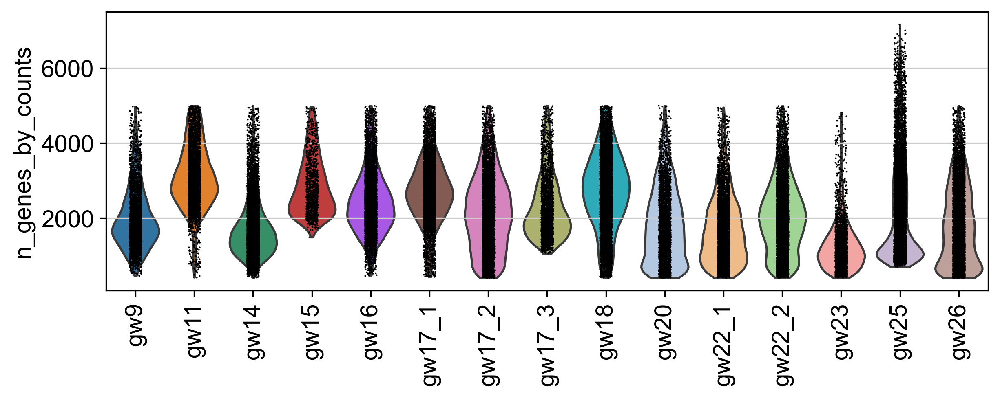

In [7]:
sc.set_figure_params(figsize=(8,3),frameon=False,dpi=150,dpi_save=600)
sc.pl.violin(adata_new, ['n_genes_by_counts'], save="_human_cochlea_scanvi_genes.pdf",
             
             groupby='sample',rotation=90)

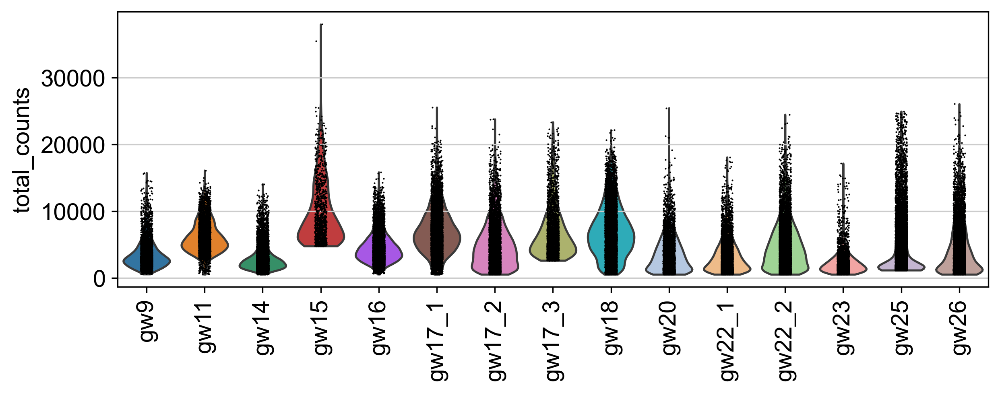

In [8]:
sc.set_figure_params(figsize=(8,3),frameon=False,dpi=150,dpi_save=600)
sc.pl.violin(adata_new, ['total_counts'], save="_human_cochlea_scanvi_counts.pdf",
             
             groupby='sample',rotation=90)

### FIGURE S1d

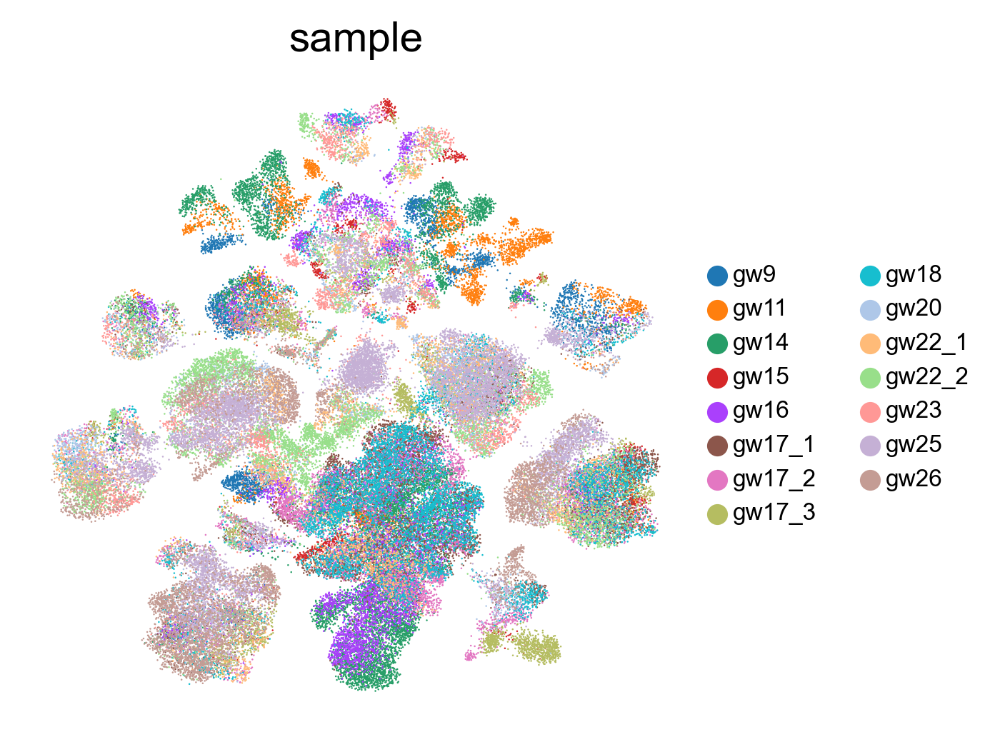

In [9]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.umap(adata_new, color=['sample'], wspace=0.5,ncols=1,save='_human_cochlea_sample.pdf',
           legend_fontsize=8,) #legend_loc='on data',

### FIGURE S1e

In [11]:
cut_labels_4 = ['< 12', '< 16','< 20','< 24','< 28', ]
cut_bins = [0, 12, 16,20,24,28 ]

adata_new.obs["age_bins"] = pd.cut(adata_new.obs["gw"], bins=cut_bins, labels=cut_labels_4).astype("str")
adata_new.obs["age_bins"] = pd.Categorical(adata_new.obs["age_bins"], categories=cut_labels_4, ordered=True)
adata_new.obs["age_bins"]

9.5gw_AAACCCAAGCTGCCTG     < 12
9.5gw_AAACCCAAGGCTGTAG     < 12
9.5gw_AAACCCAGTTAGTCGT     < 12
9.5gw_AAACCCATCGGTCATA     < 12
9.5gw_AAACCCATCTACCCAC     < 12
                           ... 
26+3gw_TTTGTTGTCATGGATC    < 28
26+3gw_TTTGTTGTCCGATCGG    < 28
26+3gw_TTTGTTGTCGATGCAT    < 28
26+3gw_TTTGTTGTCGGCTATA    < 28
26+3gw_TTTGTTGTCTCATTTG    < 28
Name: age_bins, Length: 82533, dtype: category
Categories (5, object): ['< 12' < '< 16' < '< 20' < '< 24' < '< 28']

In [12]:
# Convert covariate to continous
adata_new.obs['age_bins'] = adata_new.obs['age_bins'].cat.codes
adata_new.obs['age_bins']
adata_new.obs.groupby(['gw','sample_id','age_bins']).apply(len)

9.5gw_AAACCCAAGCTGCCTG     0
9.5gw_AAACCCAAGGCTGTAG     0
9.5gw_AAACCCAGTTAGTCGT     0
9.5gw_AAACCCATCGGTCATA     0
9.5gw_AAACCCATCTACCCAC     0
                          ..
26+3gw_TTTGTTGTCATGGATC    4
26+3gw_TTTGTTGTCCGATCGG    4
26+3gw_TTTGTTGTCGATGCAT    4
26+3gw_TTTGTTGTCGGCTATA    4
26+3gw_TTTGTTGTCTCATTTG    4
Name: age_bins, Length: 82533, dtype: int8

C:\Users\Dell\AppData\Local\Temp\ipykernel_21884\712163340.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata_new.obs.groupby(['gw','sample_id','age_bins']).apply(len)
C:\Users\Dell\AppData\Local\Temp\ipykernel_21884\712163340.py:4: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  adata_new.obs.groupby(['gw','sample_id','age_bins']).apply(len)


gw  sample_id  age_bins
9   gw9        0            3463
11  gw11       0            3660
14  gw14       1           10504
15  gw15       1            1063
16  gw16       1            6684
17  gw17_1     2            5714
    gw17_2     2            5207
    gw17_3     2            2696
18  gw18       2            8207
20  gw20       2            3343
22  gw22_1     3            4646
    gw22_2     3            6924
23  gw23       3            2840
25  gw25       4           11354
26  gw26       4            6228
dtype: int64

In [13]:
adata_new.obs['age_bins2'] = adata_new.obs['age_bins'].astype('category')

<Axes: title={'center': 'GW<12 (n=7123)'}, xlabel='UMAP1', ylabel='UMAP2'>

<Axes: title={'center': 'GW<16 (n=18251)'}, xlabel='UMAP1', ylabel='UMAP2'>

<Axes: title={'center': 'GW<20 (n=25167)'}, xlabel='UMAP1', ylabel='UMAP2'>

<Axes: title={'center': 'GW<24 (n=14410)'}, xlabel='UMAP1', ylabel='UMAP2'>

<Axes: title={'center': 'GW<28 (n=17582)'}, xlabel='UMAP1', ylabel='UMAP2'>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.02, 'UMAP: Age Groups Highlighted')

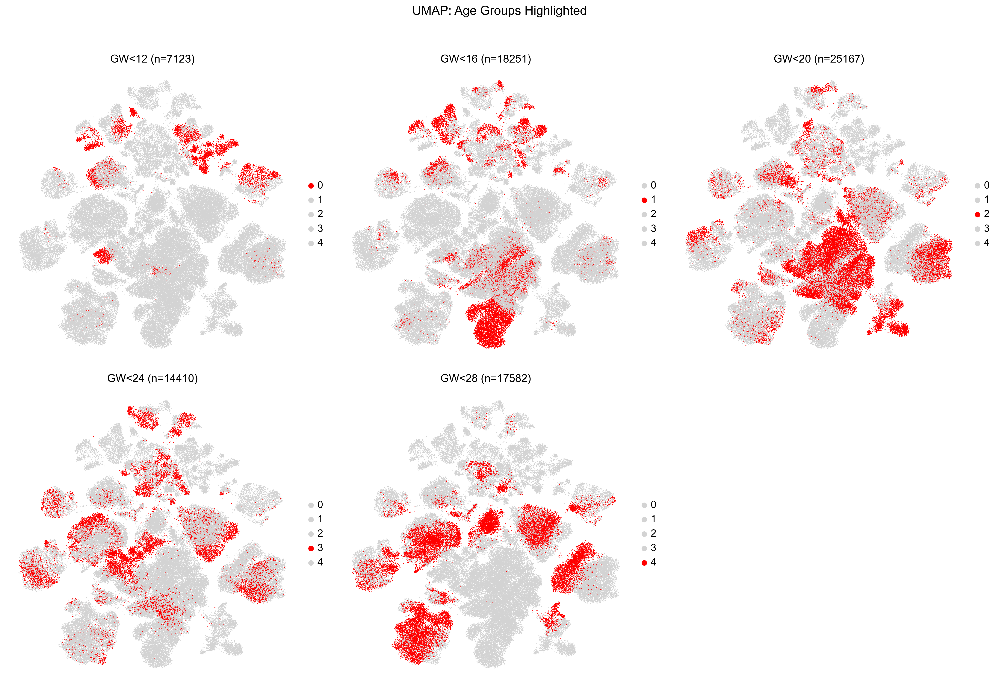

In [14]:
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np

category_labels = {
    0: 'GW<12',
    1: 'GW<16',
    2: 'GW<20',
    3: 'GW<24',
    4: 'GW<28'
}


categories = [0, 1, 2, 3, 4]
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

for idx, cat in enumerate(categories):
    ax = axes[idx]
    color_mapping = {i: '#D3D3D3' for i in categories}
    color_mapping[cat] = '#FF0000'
    n_cells = sum(adata_new.obs["age_bins2"] == cat)
    sc.pl.umap(adata_new, color='age_bins2', 
               palette=color_mapping,
               title=f'{category_labels[cat]} (n={n_cells})',
               frameon=False,
               size=5,
               ax=ax,
               show=False)
axes[5].axis('off')

plt.suptitle('UMAP: Age Groups Highlighted', fontsize=16, y=1.02)
plt.tight_layout()
plt.savefig(data_dir+'/figures/figure1_S1/_age_bins_highlighted.pdf', dpi=300, bbox_inches='tight', format='pdf')
plt.show()

### FIGURE S1f

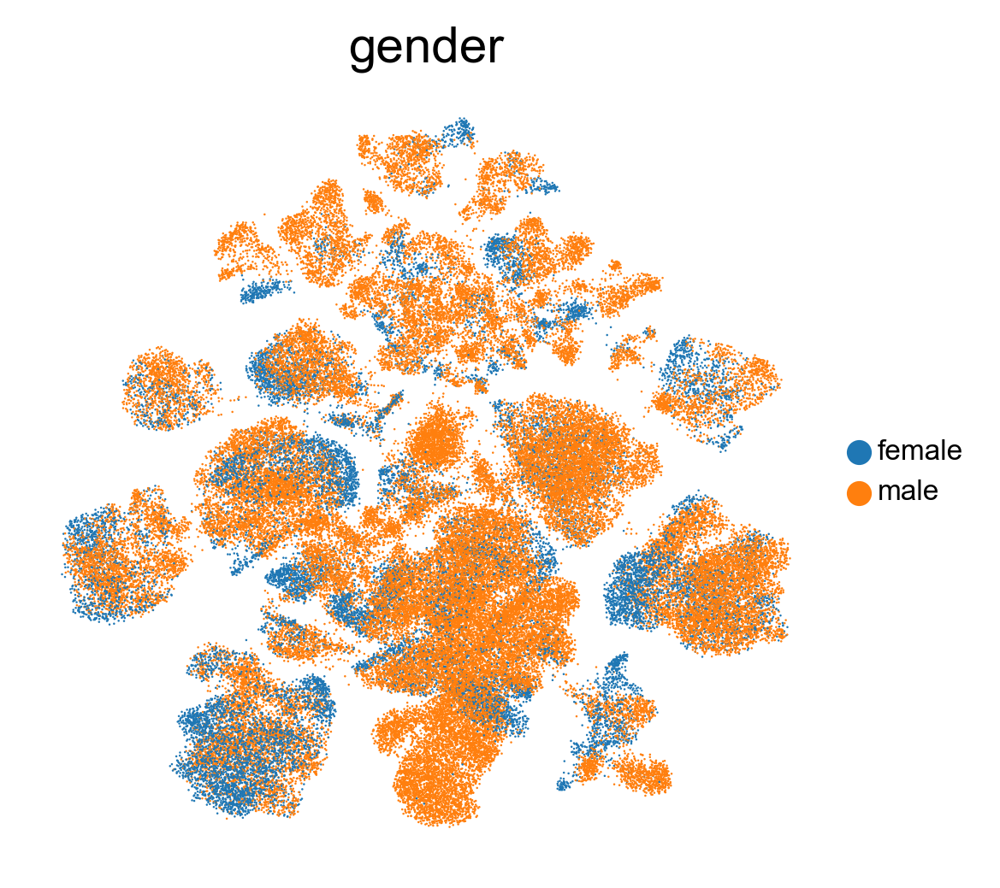

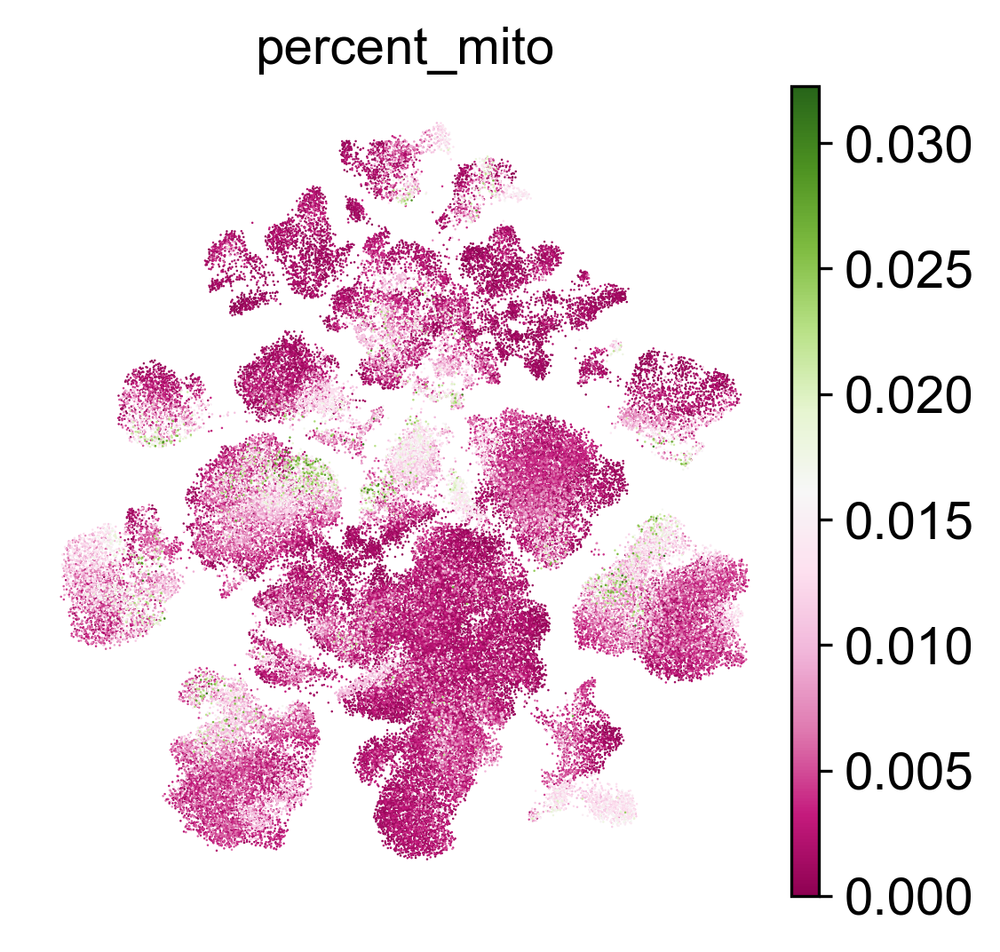

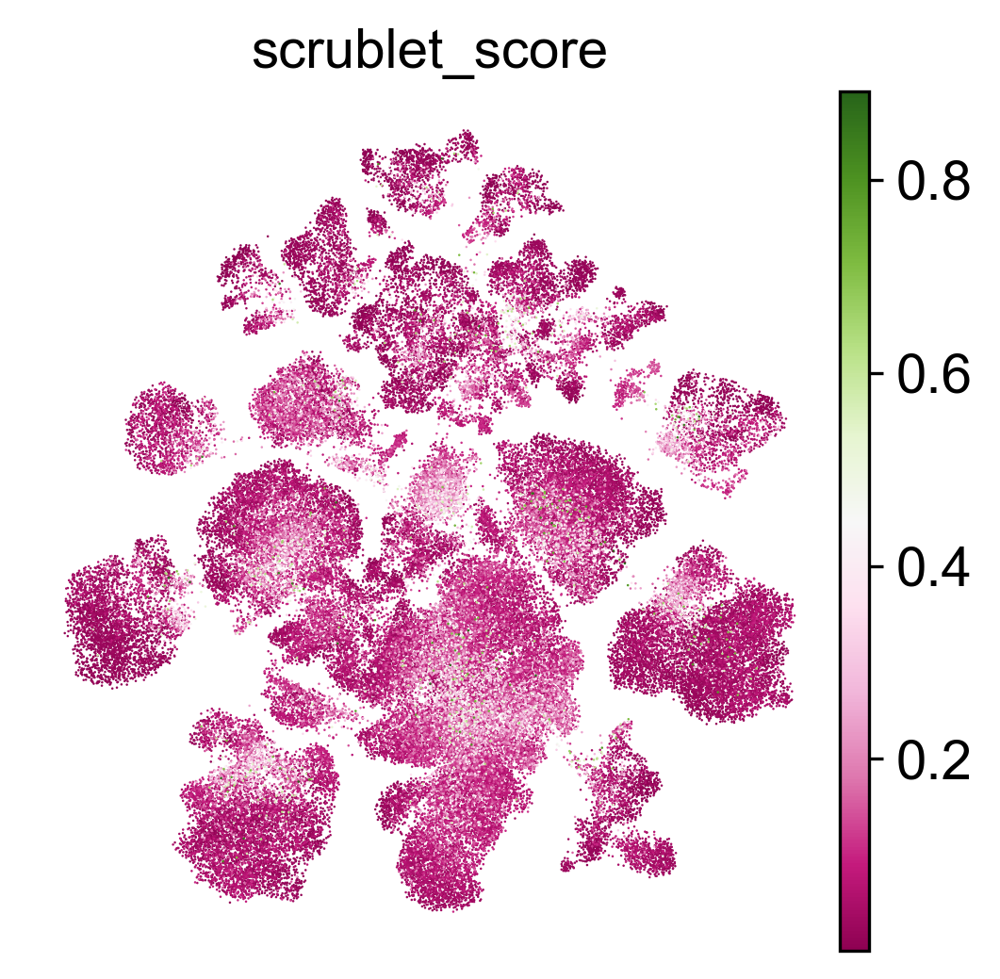

In [16]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.umap(adata_new, color=['gender'], wspace=0.5,ncols=1,save='_human_cochlea_gender.pdf',
           legend_fontsize=8,) #legend_loc='on data',
sc.pl.umap(adata_new, color=['percent_mito'], wspace=0.5,ncols=1,save='_human_cochlea_mito.pdf',color_map = "PiYG",
           legend_fontsize=8,) #legend_loc='on data',
sc.pl.umap(adata_new, color=['scrublet_score'], wspace=0.5,ncols=1,save='_human_cochlea_scrublet_score.pdf',color_map = "PiYG",
           legend_fontsize=8,) #legend_loc='on data',

### FIGURE S1g

In [17]:
small_marker_dict={
 'Cochlear duct floor lateral':["GATA3",],
     'Cochlear duct floor medial':["TECTA",],
    'Cochlear roof cells':[ "OTX2","OC90",	"FGF9",	"WNT4",	"GSC",],
    'Cochlear duct floor prosensory':[ "RORB","ISL1","LGR5",],
'Hair cell':['MYO7A',"STRC",],
    'Pan_Supporting_cells':['OTOG','OTOGL'],
'Pillar_cells' :['LGR6',],
   'Deiters_cells':['FGFR3','PROX1'],
 'Interdental_cells':['OTOA'],
     'Claudius/Inner-Outer_sulcus_cells':['EPYC'],
     'Inner_border-phalangeal/Hensen_cells':['S100A1','SLC1A3'],
   'Neurons' :["EPHA5",'SNAP25','NEFL',], 
     'Glial.Cells':['MPZ','PRX',"PLP1","PMP22",],
 'Vestibular Dark cells':["SPP1",],
 'Vestibular epithelial cells':[ "MEIS2","ADAMTSL1",],
    
'Vestibular roof cells':[ "NTN1","SMOC2","WNT3",],
     'Vestibular supporting cells':[ "USH1C",],
'Cycling cells' :[ "MKI67","TOP2A","HMGB2",],
'Erythrocytes':["HBG2",],
    'macrophages':["PTPRC",'AIF1','CD163'], 
    'Tympanic border cells':['EMILIN2','NOTUM','RARRES1'],
'Reissner membrane':["SLC26A7"],
 'pre-Osteoblasts':["DLX5","RUNX2",],
    'Osteoblasts':[ "IBSP","IFITM5"],
      'Osteocytes':["DMP1","PHEX",],
'Surrounding structures':["OSR2",],
'Endothelial cells':["PECAM1",'VWF','ESAM'],
   'Basal stria':['CLDN11','ATP6V0A4','TJP1'], 
    'Marginal stria':['KCNE1','ESRRB',], 
    'Intermediate stria':['TYR','DCT'],
'Fibrocytes':['OTOS','CAR3','COL9A2','COL9A3'],
 'pericytes':['RGS5'],
    'Spindle/Root_cells':['SLC26A4',],
     'Smooth Muscle Cells':["TAGLN"],
   'Chondrocytes' :["ACAN"],
    'Melanocytes' :[ "MLANA"],
     'Mesenchymal':["PRRX1",], 
    
}
# check if the markers are in the data
smarker_genes_in_data = dict()
for ct, markers in small_marker_dict.items():
    markers_found = list()
    for marker in markers:
        if marker in adata_new.var.index:
            markers_found.append(marker)
    smarker_genes_in_data[ct] = markers_found
#del [] # remove the last marker
del_markers = list()
for ct, markers in smarker_genes_in_data.items():
    if markers==[]:
        del_markers.append(ct)
for ct in del_markers:
    del smarker_genes_in_data[ct]

In [19]:
adata_new.obs['cell_type_final'] = adata_new.obs['cell_type_final'].cat.reorder_categories([
    'CoE_Lateral','CoE_Medial','CoE_Roof_cells','CoE_prosensory','Cochlear_HCs',
    'Vestibular_HCs',
    'SCs','Pillar_cells','Deiters_cells','Interdental_cells','Claudius/Inner-Outer_sulcus_cells',
    'Inner_border-phalangeal/Hensen_cells','SGNs','VGNs','GCs',
    'Vestibular_Dark_cells','Vestibular_Epithelial_cells','Vestibular_Roof_cells','Vestibular_SCs',
    'CCs','Erythrocytes','Macrophages',
    'Tympanic_border_cells','Reissner_membrane','pre-Osteoblasts','pre-Osteocytes',
    'Osteoblasts','Osteocytes',
    'SS',
    'Endothelial','Basal_stria',
    'Marginal_stria', 'Intermediate_stria',
    'Fibrocytes','Pericytes','Spindle/Root_cells','Smooth_Muscle_Cells',
    'Chondrocytes', 'Melanocytes', 'Mesenchymal',
])

In [20]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=300,dpi_save=600)
#sc.tl.dendrogram(adata, groupby='cell_type_final')
sc.pl.dotplot(
    adata_new,
    groupby="cell_type_final",
    var_names=smarker_genes_in_data,
  # dendrogram=True,
    standard_scale="var",  # standard scale: normalize each gene to range from 0 to 1
     save="_human_prenatal_cochlea_annotation_markers.pdf"
)